# Loading data using virtual products <img align="right" src="../Supplementary_data/dea_logo.jpg">

* [**Sign up to the DEA Sandbox**](https://docs.dea.ga.gov.au/setup/sandbox.html) to run this notebook interactively from a browser
* **Compatibility:** Notebook currently compatible with both the `NCI` and `DEA Sandbox` environments
* **Products used:** 
[s2a_ard_granule](https://explorer.sandbox.dea.ga.gov.au/s2a_ard_granule), 
[s2b_ard_granule](https://explorer.sandbox.dea.ga.gov.au/s2b_ard_granule)

## Background
In addition to the [Datacube.load](https://datacube-core.readthedocs.io/en/latest/dev/api/generate/datacube.Datacube.load.html) function, Open Data Cube also provide a mechanism to load data from _virtual_ products.
These products are created by combining existing products in different ways. 
They are designed to make it easier to assemble data from different bands and different sensors together, but they can be useful even when dealing with a single datacube product.

## Description
This notebook introduces virtual products and provides examples of how to achieve simple data transformations with them. This includes:

1. Loading a simple product
2. Applying a cloud mask
3. Applying a dilated cloud mask
4. Calculating band math and indices
5. Combining multiple sensors
6. Using virtual products with Dask
7. Calculating statistics and custom transforms
8. Masking nodata
9. Loading data at native resolution
10. Reprojecting on the fly


The reference documentation on virtual products can be found [here](https://datacube-core.readthedocs.io/en/latest/dev/virtual-products.html).

***

## Getting started


First we import the required Python packages, then we connect to the database, and load the catalog of virtual products.

In [1]:
%matplotlib inline

import sys
import datacube
from datacube.virtual import catalog_from_file

sys.path.append('../Scripts')
from dea_plotting import rgb

/env/lib/python3.6/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.7.2-CAPI-1.11.0 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


## Connect to the datacube

In [2]:
dc = datacube.Datacube(app='Virtual_products')

/env/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


## Load virtual products catalogue
For the examples below, we will load some example data using some pre-defined virtual products from a YAML catalog file, `virtual-product-catalog.yaml` in the `Supplementary_data/Virtual_products` directory (view on [GitHub](https://github.com/GeoscienceAustralia/dea-notebooks/blob/develop/Supplementary_data/Virtual_products/virtual-product-catalog.yaml) or in [Jupyter](../Supplementary_data/Virtual_products/virtual-product-catalog.yaml)). 
First we load the catalogue of virtual products:

In [3]:
catalog = catalog_from_file('../Supplementary_data/Virtual_products/virtual-product-catalog.yaml')

We can list the products and transforms that the catalog defines:

In [4]:
list(catalog)

['s2a_ard_granule_simple',
 's2a_nbart_rgb',
 's2a_nbart_rgb_renamed',
 's2a_nbart_rgb_nodata_masked',
 's2a_nbart_rgb_and_fmask',
 's2a_nbart_rgb_and_fmask_native',
 's2a_nbart_rgb_and_fmask_albers',
 's2a_fmask',
 's2a_cloud_free_nbart_rgb_albers',
 's2a_cloud_free_nbart_rgb_albers_reprojected',
 's2a_cloud_free_nbart_rgb_albers_dilated',
 's2a_NDVI',
 's2a_optical_albers',
 's2a_optical_and_fmask_albers',
 's2a_tasseled_cap',
 's2a_cloud_free_tasseled_cap',
 's2a_mean',
 's2_nbart_rgb',
 'nbart_ndvi_transform',
 'nbart_tasseled_cap_transform']

We will go through them one by one.
We also specify our example area of interest throughout this notebook.

In [5]:
query = {'x': (153.38, 153.47),
         'y': (-28.83, -28.92),
         'time': ('2018-01', '2018-02')}

## Single datacube product

A virtual product is defined by what we call a "recipe" for it.
If we get a virtual product from the catalog and try to print it, it displays the recipe.

In [6]:
product = catalog['s2a_ard_granule_simple']
product

product: s2a_ard_granule

This very simple recipe says that this virtual product, called `s2a_ard_granule_simple`, is really just the datacube product `s2_ard_granule`.
We can use this to load some data.

In [7]:
data = product.load(dc, measurements=['fmask'], **query)
data

<xarray.Dataset>
Dimensions:      (time: 6, x: 441, y: 501)
Coordinates:
  * time         (time) datetime64[ns] 2018-01-06T23:52:37.461000 ... 2018-02...
  * y            (y) float64 6.811e+06 6.811e+06 ... 6.801e+06 6.801e+06
  * x            (x) float64 5.370e+05 5.371e+05 ... 5.458e+05 5.458e+05
    spatial_ref  int32 32756
Data variables:
    fmask        (time, y, x) uint8 1 1 1 1 1 1 1 1 1 1 ... 2 2 2 2 2 2 2 2 2 2
Attributes:
    crs:           epsg:32756
    grid_mapping:  spatial_ref

We specified the measurements to load because the complete list of measurements of this product is quite long!

In [8]:
list(dc.index.products.get_by_name('s2a_ard_granule').measurements)

['azimuthal_exiting',
 'azimuthal_incident',
 'exiting',
 'incident',
 'relative_azimuth',
 'relative_slope',
 'satellite_azimuth',
 'satellite_view',
 'solar_azimuth',
 'solar_zenith',
 'terrain_shadow',
 'fmask',
 'nbart_contiguity',
 'nbart_coastal_aerosol',
 'nbart_blue',
 'nbart_green',
 'nbart_red',
 'nbart_red_edge_1',
 'nbart_red_edge_2',
 'nbart_red_edge_3',
 'nbart_nir_1',
 'nbart_nir_2',
 'nbart_swir_2',
 'nbart_swir_3']

For the purposes of this notebook we will mostly restrict ourselves to the visible NBART bands. Besides the dictionary notation (`catalog['product_name']`), the property notation (`catalog.product_name`) also works (with the added advantage of autocompletion):

In [9]:
product = catalog.s2a_nbart_rgb
product

measurements:
- nbart_blue
- nbart_green
- nbart_red
product: s2a_ard_granule

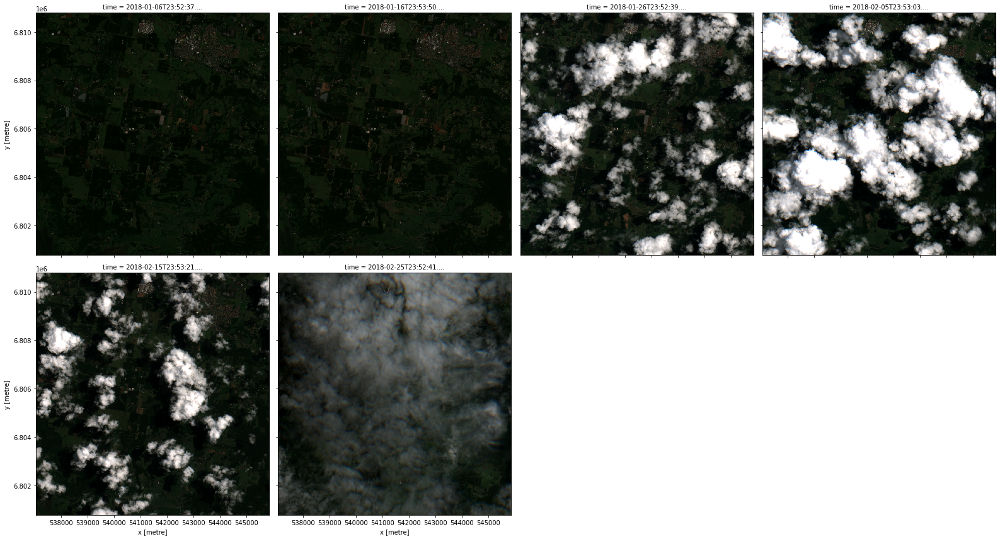

In [10]:
data = product.load(dc, **query)
rgb(data, col='time')

We will need the `fmask` band too if we want cloud-free images. However, `fmask` has a different resolution so the following does _not_ work:

In [11]:
product = catalog.s2a_nbart_rgb_and_fmask
product

measurements:
- nbart_blue
- nbart_green
- nbart_red
- fmask
product: s2a_ard_granule

In [12]:
try:
    data = product.load(dc, **query)
except ValueError as e:
    print(e, file=sys.stderr)

Not all bands share the same pixel grid


In general, to load datasets from a product that is not "ingested", such as those in `s2a_ard_granule`, datacube needs to be provided with the `output_crs` and `resolution` (and possibly `align` for sub-pixel alignment).

> **Note:** In this notebook so far we have got away without specifying these.
> This is because the area of interest we chose happens to contain datasets from only one CRS (coordinate reference system), and the virtual product engine could figure out what grid specification to use.
> See sections on [reprojecting](#Reprojecting-on-the-fly) and [native load](#Native-load) later on in this notebook for more on this.

We can set these in the virtual product so not to repeat ourselves:

In [13]:
product = catalog.s2a_nbart_rgb_and_fmask_albers
product

measurements:
- nbart_blue
- nbart_green
- nbart_red
- fmask
output_crs: EPSG:3577
product: s2a_ard_granule
resampling:
  '*': average
  fmask: nearest
resolution:
- -20
- 20

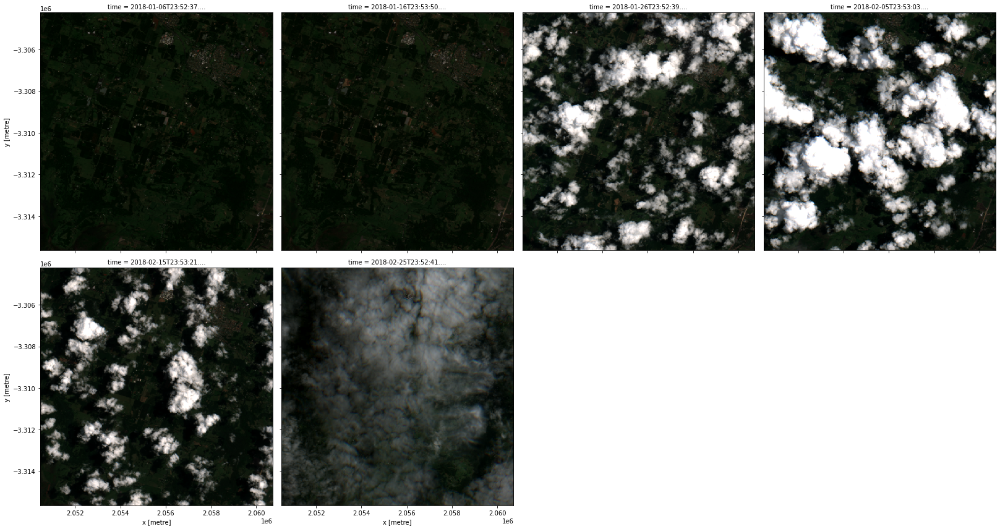

In [14]:
# We do not need to specify output crs or resolution here because the product does it for us
data = product.load(dc, **query)
rgb(data, col='time', col_wrap=4)

## Data transformations

### Cloud-free NBART

So now that we have got the `fmask` measurement (_i.e._ band), we can mask out the cloud.
First, let's create the mask that only keeps the valid pixels.

In [15]:
product = catalog.s2a_fmask
product

flags:
  fmask: valid
input:
  measurements:
  - fmask
  product: s2a_ard_granule
mask_measurement_name: fmask
transform: datacube.virtual.transformations.MakeMask

In [16]:
data = product.load(dc, **query)
data

<xarray.Dataset>
Dimensions:      (time: 6, x: 441, y: 501)
Coordinates:
  * time         (time) datetime64[ns] 2018-01-06T23:52:37.461000 ... 2018-02...
  * y            (y) float64 6.811e+06 6.811e+06 ... 6.801e+06 6.801e+06
  * x            (x) float64 5.370e+05 5.371e+05 ... 5.458e+05 5.458e+05
    spatial_ref  int32 32756
Data variables:
    fmask        (time, y, x) bool True True True True ... False False False
Attributes:
    crs:           epsg:32756
    grid_mapping:  spatial_ref

We now have an `fmask` band as a boolean mask we want to apply.

Notice that the recipe this time specifies a `transform` to be applied (`datacube.virtual.transformations.MakeMask`, which is referred to by its short name `make_mask` in the file `virtual-product-catalog.yaml`).
That transformation takes certain parameters (`flags` and `mask_measurement_name` in this case).
It also needs the `input`, which is this case is the `fmask` band from the `s2a_ard_granule` product.
You can have other virtual products as input too.

The next step is to apply it to the rest of the bands.

In [17]:
product = catalog.s2a_cloud_free_nbart_rgb_albers
product

input:
  flags:
    fmask: valid
  input:
    measurements:
    - nbart_blue
    - nbart_green
    - nbart_red
    - fmask
    output_crs: EPSG:3577
    product: s2a_ard_granule
    resampling:
      '*': average
      fmask: nearest
    resolution:
    - -20
    - 20
  mask_measurement_name: fmask
  transform: datacube.virtual.transformations.MakeMask
mask_measurement_name: fmask
preserve_dtype: false
transform: datacube.virtual.transformations.ApplyMask

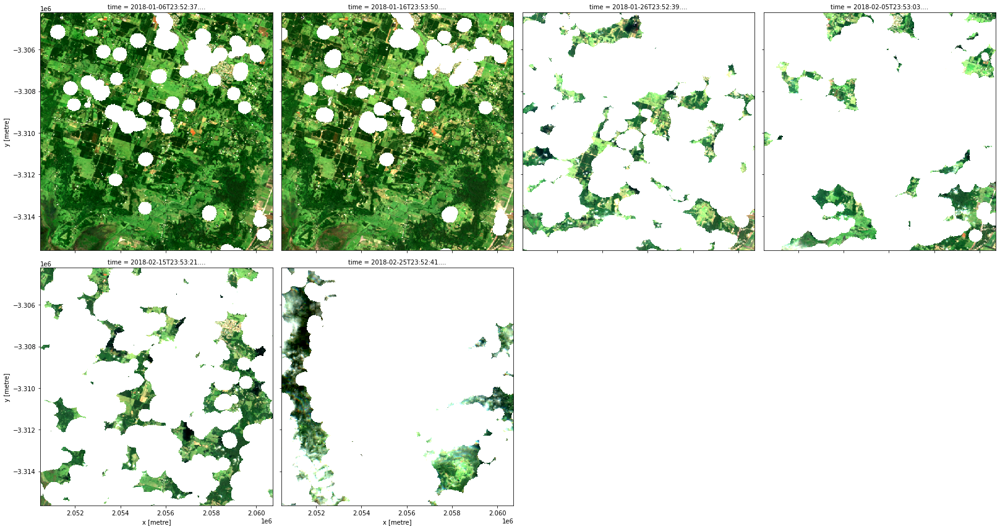

In [18]:
data = product.load(dc, **query)
rgb(data, col='time', col_wrap=4)

This time there were two (nested) applications of transforms.
The outer transform `apply_mask` (_i.e._ `datacube.virtual.transformations.ApplyMask`) took as input the result of the inner transform `make_mask` (_i.e._ `datacube.virtual.transformations.MakeMask`) that was applied, in turn, to the Albers projected NBART bands.
Just like mathematical function applications, this recipe too can be read inside out (or right to left) as a data transformation pipeline: we started from our customized `s2a_ard_granule` product, then we applied the `make_mask` transform to it, and then we applied the `apply_mask` transform to its output.

You could give `apply_mask` any boolean band (specified by `mask_measurement_name`) to apply, even if it is not created using `make_mask`.

> **Note**: The recipe this time was pretty verbose.
> One advantage of using one catalog for many related virtual products is that parts of their recipes can be shared using some YAML features called [anchors and references](https://en.wikipedia.org/wiki/YAML#Advanced_components).
> See the recipe for the `s2a_cloud_free_nbart_rgb_albers` product that we just used in the `virtual-product-catalog.yaml` file (view on [GitHub](https://github.com/GeoscienceAustralia/dea-notebooks/blob/develop/Supplementary_data/Virtual_products/virtual-product-catalog.yaml) or in [Jupyter](../Supplementary_data/Virtual_products/virtual-product-catalog.yaml)).
> In this case, we recognize that the `input` to the transform is just the product `s2a_nbart_rgb_and_fmask_albers` that we had defined earlier.

### Dilation of masks

The `make_mask` transform optionally can take an argument called `dilation` that specifies additional buffer for the mask in pixel units. The following recipe is essentially the same as that for `s2a_cloud_free_nbart_rgb_albers` except for the dilation set to 10 pixels.

In [19]:
product = catalog.s2a_cloud_free_nbart_rgb_albers_dilated
product

dilation: 10
input:
  flags:
    fmask: valid
  input:
    measurements:
    - nbart_blue
    - nbart_green
    - nbart_red
    - fmask
    output_crs: EPSG:3577
    product: s2a_ard_granule
    resampling:
      '*': average
      fmask: nearest
    resolution:
    - -20
    - 20
  mask_measurement_name: fmask
  transform: datacube.virtual.transformations.MakeMask
mask_measurement_name: fmask
preserve_dtype: false
transform: datacube.virtual.transformations.ApplyMask

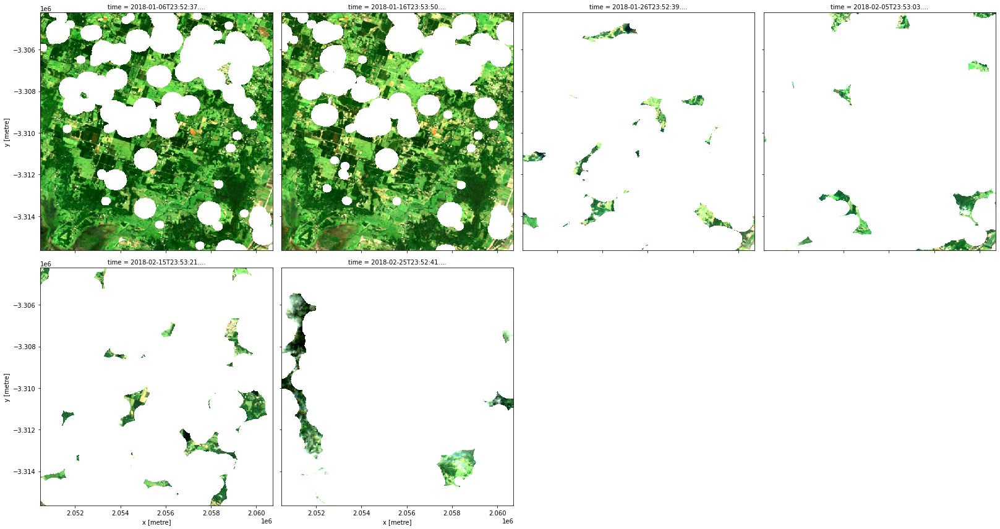

In [20]:
data = product.load(dc, **query)
rgb(data, col='time', col_wrap=4)

### Band math

One particularly useful transformation is called `expressions` (_i.e._ `datacube.virtual.transformations.Expressions`) which allows us to use Python arithmetic on bands.

In [21]:
product = catalog.s2a_NDVI
product

input:
  measurements:
  - nbart_red
  - nbart_nir_1
  product: s2a_ard_granule
output:
  NDVI:
    dtype: float32
    formula: (nbart_nir_1 - nbart_red) / (nbart_nir_1 + nbart_red)
transform: datacube.virtual.transformations.Expressions

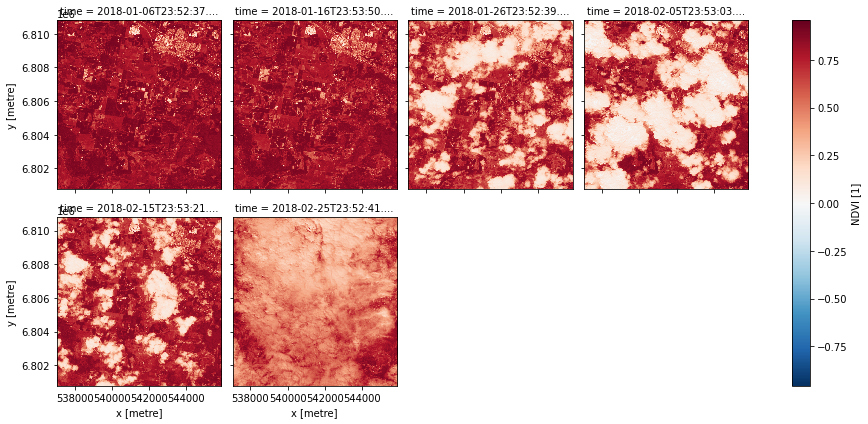

In [22]:
data = product.load(dc, **query)
data.NDVI.plot.imshow(col='time', col_wrap=4)

In a similar fashion, we can define a virtual product that calculates the Tasseled Cap indices too.

In [23]:
product = catalog.s2a_tasseled_cap
product

input:
  measurements:
  - nbart_blue
  - nbart_green
  - nbart_red
  - nbart_nir_1
  - nbart_swir_2
  - nbart_swir_3
  output_crs: EPSG:3577
  product: s2a_ard_granule
  resampling: average
  resolution:
  - -20
  - 20
output:
  brightness:
    dtype: float32
    formula: 0.2043 * nbart_blue + 0.4158 * nbart_green + 0.5524 * nbart_red + 0.5741
      * nbart_nir_1 + 0.3124 * nbart_swir_2 + -0.2303 * nbart_swir_3
  greenness:
    dtype: float32
    formula: -0.1603 * nbart_blue + -0.2819 * nbart_green + -0.4934 * nbart_red +
      0.7940 * nbart_nir_1 + -0.0002 * nbart_swir_2 + -0.1446 * nbart_swir_3
  wetness:
    dtype: float32
    formula: 0.0315 * nbart_blue + 0.2021 * nbart_green + 0.3102 * nbart_red + 0.1594
      * nbart_nir_1 + -0.6806 * nbart_swir_2 + -0.6109 * nbart_swir_3
transform: datacube.virtual.transformations.Expressions

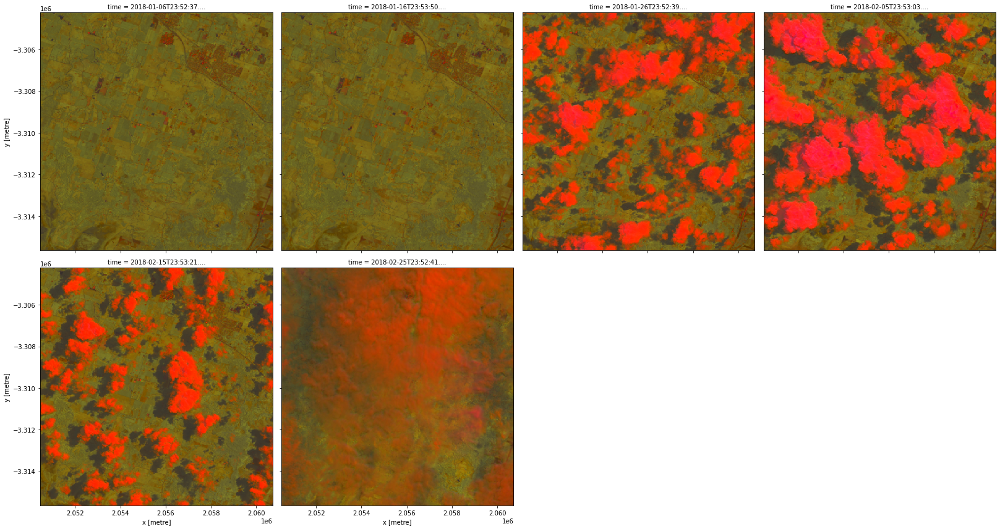

In [24]:
data = product.load(dc, **query)
rgb(data, bands=['brightness', 'greenness', 'wetness'], col='time', col_wrap=4)

The cloud-free version would probably be more useful for analysis.

In [25]:
product = catalog.s2a_cloud_free_tasseled_cap
product

input:
  input:
    flags:
      fmask: valid
    input:
      measurements:
      - nbart_blue
      - nbart_green
      - nbart_red
      - nbart_nir_1
      - nbart_swir_2
      - nbart_swir_3
      - fmask
      output_crs: EPSG:3577
      product: s2a_ard_granule
      resampling:
        '*': average
        fmask: nearest
      resolution:
      - -20
      - 20
    mask_measurement_name: fmask
    transform: datacube.virtual.transformations.MakeMask
  mask_measurement_name: fmask
  transform: datacube.virtual.transformations.ApplyMask
output:
  brightness:
    dtype: float32
    formula: 0.2043 * nbart_blue + 0.4158 * nbart_green + 0.5524 * nbart_red + 0.5741
      * nbart_nir_1 + 0.3124 * nbart_swir_2 + -0.2303 * nbart_swir_3
  greenness:
    dtype: float32
    formula: -0.1603 * nbart_blue + -0.2819 * nbart_green + -0.4934 * nbart_red +
      0.7940 * nbart_nir_1 + -0.0002 * nbart_swir_2 + -0.1446 * nbart_swir_3
  wetness:
    dtype: float32
    formula: 0.0315 * nbart_blue +

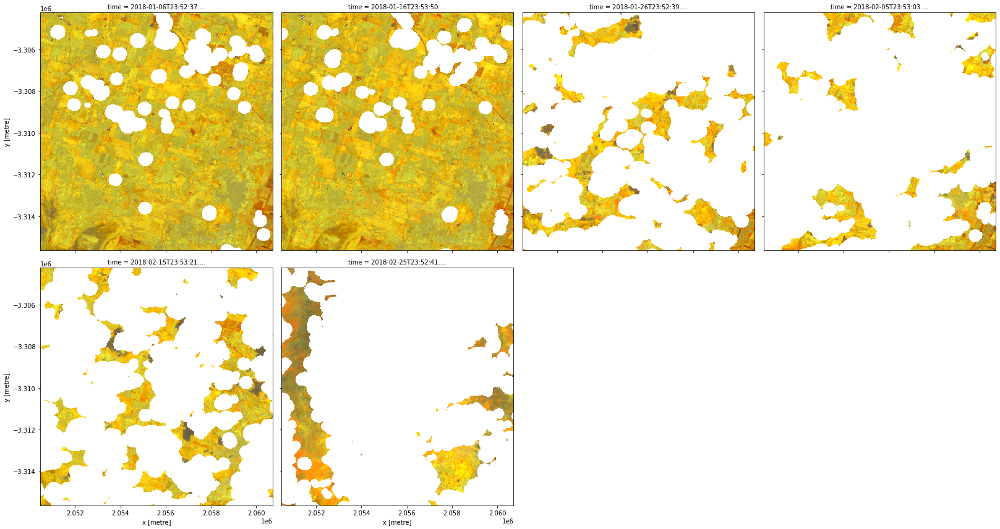

In [26]:
data = product.load(dc, **query)

rgb(data, bands=['brightness', 'greenness', 'wetness'], col='time', col_wrap=4)

## Combining sensors

To combine multiple sensors into one virtual product, we can use the `collate` combinator.

In [27]:
product = catalog.s2_nbart_rgb
product

collate:
- measurements:
  - nbart_blue
  - nbart_green
  - nbart_red
  product: s2a_ard_granule
- measurements:
  - nbart_blue
  - nbart_green
  - nbart_red
  product: s2b_ard_granule

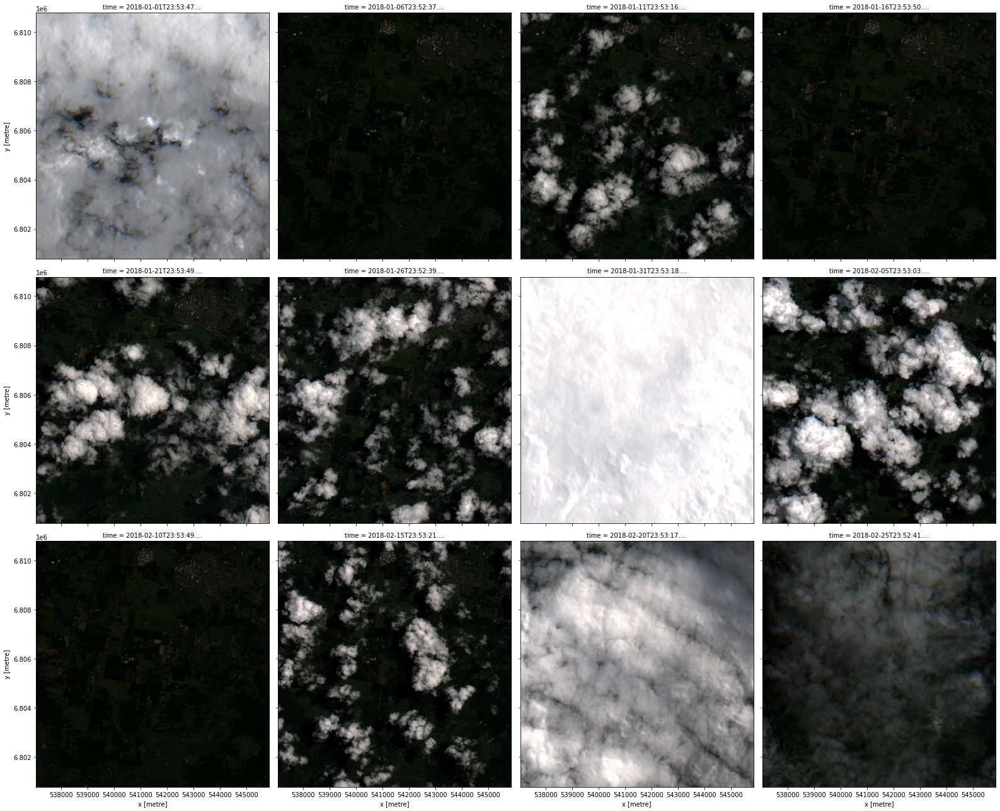

In [28]:
data = product.load(dc, **query)
rgb(data, col='time', col_wrap=4)

You can collate any number of virtual products as long as they share the same set of measurements.

## More advanced usage

### Dask

[Dask](https://dask.org/) is a useful tool when working with large analyses (either in space or time) as it breaks data into manageable chunks that can be easily stored in memory.
It can also use multiple computing cores to speed up computations.

To load virtual products using Dask, pass the `dask_chunks` specification to the `load` method.

> **Note:** For more information about using Dask, refer to the [Parallel processing with Dask](07_Parallel_processing_with_Dask.ipynb) notebook.

In [29]:
data = catalog.s2a_NDVI.load(dc, dask_chunks={'time': 1, 'x': 2000, 'y': 2000}, **query)
data

<xarray.Dataset>
Dimensions:      (time: 6, x: 882, y: 1001)
Coordinates:
  * time         (time) datetime64[ns] 2018-01-06T23:52:37.461000 ... 2018-02...
  * y            (y) float64 6.811e+06 6.811e+06 ... 6.801e+06 6.801e+06
  * x            (x) float64 5.37e+05 5.371e+05 ... 5.458e+05 5.459e+05
    spatial_ref  int32 32756
Data variables:
    NDVI         (time, y, x) float32 dask.array<chunksize=(1, 1001, 882), meta=np.ndarray>
Attributes:
    crs:           epsg:32756
    grid_mapping:  spatial_ref

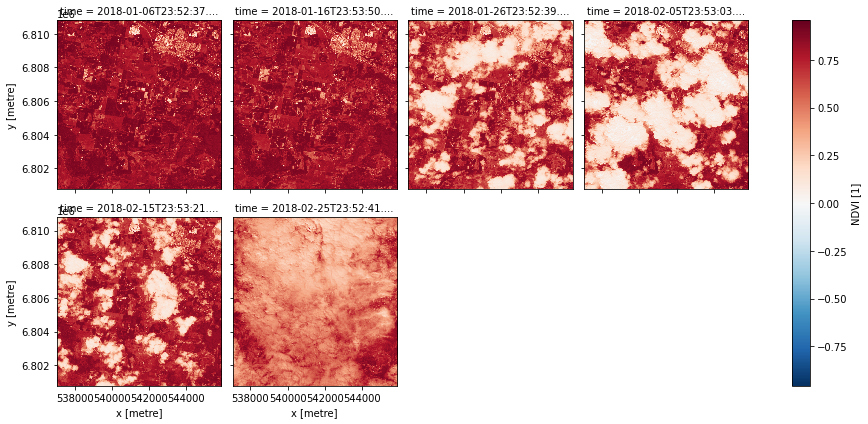

In [30]:
data.compute().NDVI.plot.imshow(col='time', col_wrap=4)

### Statistics

Virtual products support some statistics out-of-the-box (those supported by `xarray` methods).
Here we calculate the mean image of our area of interest.
Grouping by year here groups all the data together since our specified time range falls within a year.

In [31]:
product = catalog.s2a_mean
product

aggregate: datacube.virtual.transformations.XarrayReduction
group_by: datacube.virtual.transformations.year
input:
  input:
    flags:
      fmask: valid
    input:
      measurements:
      - nbart_blue
      - nbart_green
      - nbart_red
      - fmask
      output_crs: EPSG:3577
      product: s2a_ard_granule
      resampling:
        '*': average
        fmask: nearest
      resolution:
      - -20
      - 20
    mask_measurement_name: fmask
    transform: datacube.virtual.transformations.MakeMask
  mask_measurement_name: fmask
  preserve_dtype: false
  transform: datacube.virtual.transformations.ApplyMask
method: mean

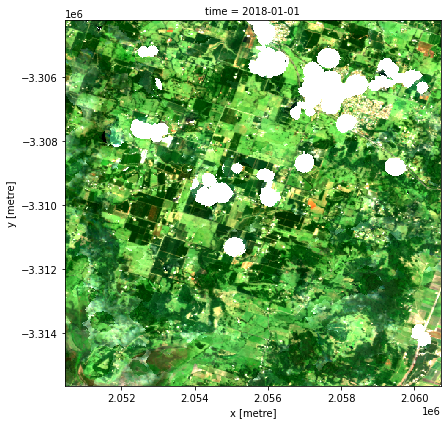

In [32]:
data = product.load(dc, **query)
rgb(data, col='time', col_wrap=4)

### User-defined transformations

We can define transformations ourselves too.
For illustrative purposes, we define the NDVI transform here again, in Python.
However, this example is going to be a little bit different since the catalog cannot possibly know about the transformation we are going to define here in the notebook.

Our transformation needs to inherit from `datacube.virtual.Transformation` and to implement the methods defined there.
The `construct` method is a lower-level way of constructing a virtual product.
We will need it since we are going to refer to a Python class directly.

In [33]:
from datacube.virtual import Transformation
from datacube.virtual import Measurement
from datacube.virtual import construct


class NDVI(Transformation):

    def compute(self, data):
        return (((data.nbart_nir_1 - data.nbart_red) /
                 (data.nbart_nir_1 + data.nbart_red))
                .astype('float32')
                .to_dataset(name='NDVI'))

    def measurements(self, input_measurements):
        return {'NDVI': Measurement(name='NDVI', dtype='float32', units='1')}


product = construct(transform=NDVI,
                    input=construct(product='s2a_ard_granule',
                                    measurements=['nbart_red', 'nbart_nir_1']))


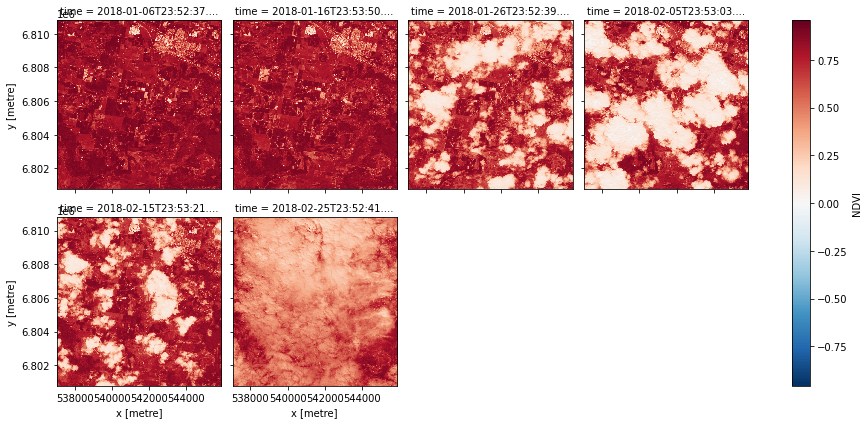

In [34]:
data = product.load(dc, **query)
data.NDVI.plot.imshow(col='time', col_wrap=4)

Note that this version does not mask `nodata` like the `expressions` version from before automatically does.

### Bonus features

#### Renaming bands

The recipe for the `expressions` transform, besides the `transform` and `input` entries common to all transfoms, contains the `output` specification, which is a dictionary mapping output band names as keys to recipes for calculating those bands as values.
These recipes can themselves be a dictionary [as before](#Band-math), containing a `formula` and optionally specifying a `dtype`, a `nodata` value, and a `units` annotation.
They can also be the name of an input band, in which case the input band is copied unaltered.
We can therefore use the `expressions` transform to copy bands, rename bands, or even drop bands simply by not including it in the `output` section.

In [35]:
product = catalog.s2a_nbart_rgb_renamed
product

input:
  measurements:
  - nbart_blue
  - nbart_green
  - nbart_red
  product: s2a_ard_granule
output:
  blue: nbart_blue
  green: nbart_green
  red: nbart_red
transform: datacube.virtual.transformations.Expressions

In [36]:
data = product.load(dc, **query)
data

<xarray.Dataset>
Dimensions:      (time: 6, x: 882, y: 1001)
Coordinates:
  * time         (time) datetime64[ns] 2018-01-06T23:52:37.461000 ... 2018-02...
  * y            (y) float64 6.811e+06 6.811e+06 ... 6.801e+06 6.801e+06
  * x            (x) float64 5.37e+05 5.371e+05 ... 5.458e+05 5.459e+05
    spatial_ref  int32 32756
Data variables:
    blue         (time, y, x) int16 210 202 216 294 302 ... 890 810 809 834 933
    green        (time, y, x) int16 422 380 416 511 503 ... 1072 1141 1219 1262
    red          (time, y, x) int16 230 205 225 340 340 ... 1243 1299 1281 1333
Attributes:
    crs:           epsg:32756
    grid_mapping:  spatial_ref

#### Masking invalid data

The data loaded by `datacube` usually have a `nodata` value specified.
Often, we want it to be replaced with the NaN value.
Since the `expressions` transform is `nodata`-aware, we get the same effect just by asking the `expressions` transform to convert the band to float.

In [37]:
product = catalog.s2a_nbart_rgb_nodata_masked
product

input:
  measurements:
  - nbart_blue
  - nbart_green
  - nbart_red
  product: s2a_ard_granule
output:
  blue:
    dtype: float32
    formula: nbart_blue
  green:
    dtype: float32
    formula: nbart_green
  red:
    dtype: float32
    formula: nbart_red
transform: datacube.virtual.transformations.Expressions

In [38]:
data = product.load(dc, **query)
data

<xarray.Dataset>
Dimensions:      (time: 6, x: 882, y: 1001)
Coordinates:
  * time         (time) datetime64[ns] 2018-01-06T23:52:37.461000 ... 2018-02...
  * y            (y) float64 6.811e+06 6.811e+06 ... 6.801e+06 6.801e+06
  * x            (x) float64 5.37e+05 5.371e+05 ... 5.458e+05 5.459e+05
    spatial_ref  int32 32756
Data variables:
    blue         (time, y, x) float32 210.0 202.0 216.0 ... 809.0 834.0 933.0
    green        (time, y, x) float32 422.0 380.0 416.0 ... 1141.0 1219.0 1262.0
    red          (time, y, x) float32 230.0 205.0 225.0 ... 1299.0 1281.0 1333.0
Attributes:
    crs:           epsg:32756
    grid_mapping:  spatial_ref

#### Native load

> This feature is in virtual product only at the moment but not in `Datacube.load`.
We plan to integrate this there in the future.

If all the datasets to be loaded are in the same CRS and all the bands to be loaded have the same resolution and sub-pixel alignment, virtual products will load them "natively", that is, in their common grid specification, as we have seen before in this notebook.

Sometimes the datasets to be loaded are all in the same CRS but the bands do not have the same resolution.
We can specify which resolution to use by setting the `like` keyword argument to the name of a band.

In [39]:
product = catalog.s2a_nbart_rgb_and_fmask_native
product

like: fmask
measurements:
- nbart_blue
- nbart_green
- nbart_red
- fmask
product: s2a_ard_granule
resampling:
  '*': average
  fmask: nearest

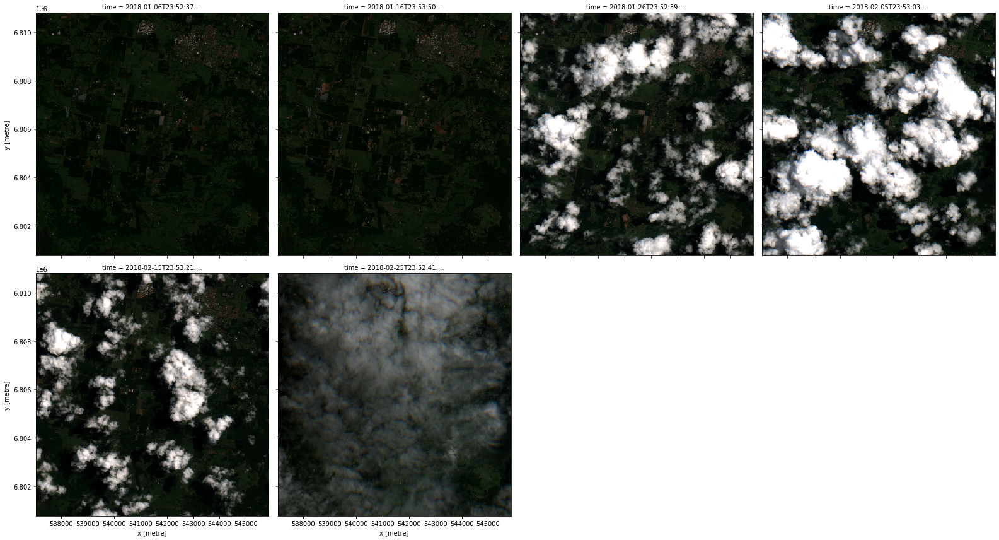

In [40]:
data = product.load(dc, **query)
rgb(data, col='time', col_wrap=4)

### Reprojecting on-the-fly

We have so far reprojected our images to Albers first, and then applied our cloud mask to it.
For (hopefully) higher spectral fidelity, we may want to apply the cloud mask in the native projection, and subsequently reproject to a common grid to obtain a dataset ready for temporal analysis.
The `reproject` combinator in virtual products allow us to do this.

In [41]:
product = catalog.s2a_cloud_free_nbart_rgb_albers_reprojected
product

input:
  input:
    flags:
      fmask: valid
    input:
      like: fmask
      measurements:
      - nbart_blue
      - nbart_green
      - nbart_red
      - fmask
      product: s2a_ard_granule
      resampling: average
    mask_measurement_name: fmask
    transform: datacube.virtual.transformations.MakeMask
  mask_measurement_name: fmask
  preserve_dtype: false
  transform: datacube.virtual.transformations.ApplyMask
reproject:
  output_crs: EPSG:3577
  resolution:
  - -20
  - 20
resampling: average

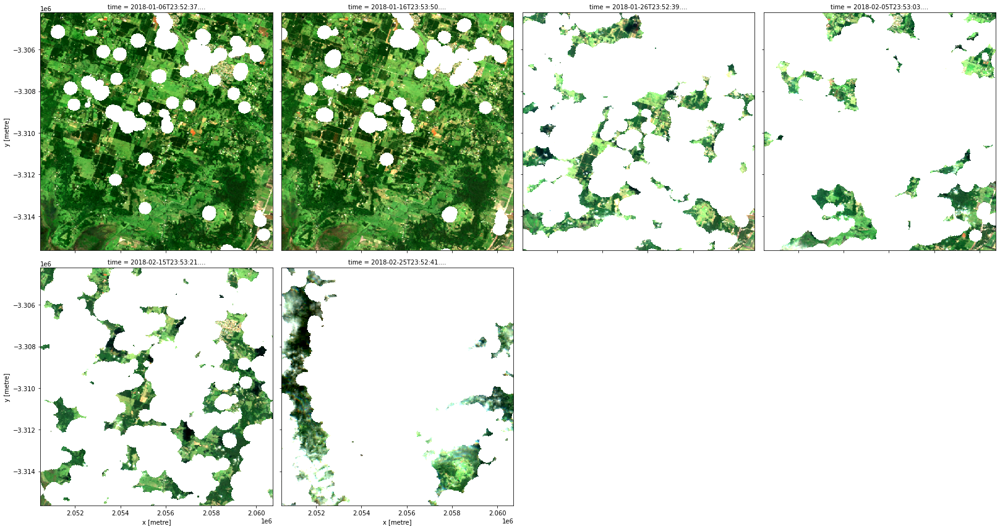

In [42]:
data = product.load(dc, **query)
rgb(data, col='time', col_wrap=4)

### Transforms defined in the catalog

We can also store unapplied transforms in the catalog:

In [43]:
catalog.nbart_tasseled_cap_transform

output:
  brightness:
    dtype: float32
    formula: 0.2043 * nbart_blue + 0.4158 * nbart_green + 0.5524 * nbart_red + 0.5741
      * nbart_nir_1 + 0.3124 * nbart_swir_2 + -0.2303 * nbart_swir_3
  greenness:
    dtype: float32
    formula: -0.1603 * nbart_blue + -0.2819 * nbart_green + -0.4934 * nbart_red +
      0.7940 * nbart_nir_1 + -0.0002 * nbart_swir_2 + -0.1446 * nbart_swir_3
  wetness:
    dtype: float32
    formula: 0.0315 * nbart_blue + 0.2021 * nbart_green + 0.3102 * nbart_red + 0.1594
      * nbart_nir_1 + -0.6806 * nbart_swir_2 + -0.6109 * nbart_swir_3
transform: expressions

The syntax for these transforms is the same as those of the products, except the `input` section is ommitted (compare the recipe of the product `s2a_tasseled_cap` here), so that we can provide the input that we want:

In [44]:
product = catalog.nbart_tasseled_cap_transform(catalog.s2a_optical_albers)
product

input:
  measurements:
  - nbart_blue
  - nbart_green
  - nbart_red
  - nbart_nir_1
  - nbart_swir_2
  - nbart_swir_3
  output_crs: EPSG:3577
  product: s2a_ard_granule
  resampling: average
  resolution:
  - -20
  - 20
output:
  brightness:
    dtype: float32
    formula: 0.2043 * nbart_blue + 0.4158 * nbart_green + 0.5524 * nbart_red + 0.5741
      * nbart_nir_1 + 0.3124 * nbart_swir_2 + -0.2303 * nbart_swir_3
  greenness:
    dtype: float32
    formula: -0.1603 * nbart_blue + -0.2819 * nbart_green + -0.4934 * nbart_red +
      0.7940 * nbart_nir_1 + -0.0002 * nbart_swir_2 + -0.1446 * nbart_swir_3
  wetness:
    dtype: float32
    formula: 0.0315 * nbart_blue + 0.2021 * nbart_green + 0.3102 * nbart_red + 0.1594
      * nbart_nir_1 + -0.6806 * nbart_swir_2 + -0.6109 * nbart_swir_3
transform: datacube.virtual.transformations.Expressions

This resultant product is equivalent to the `s2a_tasseled_cap` product, but what we have gained here is that the `nbart_tasseled_cap_transform` is more re-usable and can be applied to other products as long as they provide the `nbart_*` bands.

---

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Australia data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/GeoscienceAustralia/dea-notebooks).

**Last modified:** June 2021

**Compatible datacube version:** 

In [45]:
print(datacube.__version__)

1.8.4.dev81+g80d466a2


## Tags
Browse all available tags on the DEA User Guide's [Tags Index](https://docs.dea.ga.gov.au/genindex.html)